## Which NYC neighborhoods have the most / least access to the subway?

In [30]:
# Data manipulation
import polars as pl
import pandas as pd  # For compatibility w plotnine
import geopandas as gpd


# Visualization
from plotnine import *
import folium
from shapely import wkt
from shapely.geometry import Point


# General utilities
import janitor.polars
# import numpy as np
from datetime import datetime, timedelta
from urllib.request import urlopen
import certifi # For SSL
from zipfile import ZipFile
from io import BytesIO

In [18]:
# Download and process the zip file
url = "https://rrgtfsfeeds.s3.amazonaws.com/gtfs_subway.zip"
print("Downloading GTFS data...")

# Open the URL and create a ZipFile object

zip_file = ZipFile(BytesIO(resp.read()))


NameError: name 'resp' is not defined

In [19]:
# Download and process the zip file
url = "https://rrgtfsfeeds.s3.amazonaws.com/gtfs_subway.zip"
print("Downloading GTFS data...")

# Open the URL and create a ZipFile object
resp = urlopen(url, cafile=certifi.where())
zip_file = ZipFile(BytesIO(resp.read()))


# Read selected GTFS files into Polars DataFrames
gtfs = {}

# Define schemas to manually encode types
schemas = {
    "routes.txt": {
        "agency_id": str,	
        "route_id": str,	
        "route_short_name": str,
        "route_long_name": str,	
        "route_type": int,	
        "route_desc": str,	
        "route_url": str,	
        "route_color": str,
        "route_text_color": str
    },
    "trips.txt": {
        "route_id": str,
        "service_id": str,
        "trip_id": str,
        "trip_headsign": str,
        "direction_id": str,
        "shape_id": str
    },
    "shapes.txt": {
        "shape_id": str,
        "shape_pt_lat": float,
        "shape_pt_lon": float,
        "shape_pt_sequence": int
    },
    "stop_times.txt": {
        "trip_id": str,
        "arrival_time": str,
        "departure_time": str,
        "stop_id": str,
        "stop_sequence": int,
        "pickup_type": str,
        "drop_off_type": str
    },
    "stops.txt": {
        "stop_id": str,
        "stop_code": str,
        "stop_name": str,
        "stop_desc": str,
        "stop_lat": float,
        "stop_lon": float,
        "zone_id": str,
        "stop_url": str,
        "location_type": str,
        "parent_station": str,
        "wheelchair_boarding": str
    }
}

for fn in schemas.keys():
    print(f"\nReading {fn}...")
    with zip_file.open(fn) as f:
        pl_df = pl.read_csv(f, schema_overrides=schemas[fn])
    print(f"{fn} shape:", pl_df.shape)
    gtfs[fn] = pl_df

/var/folders/rw/r56lcxyj1k71s10356fhcw000000gn/T/ipykernel_91269/2398674652.py:6: DeprecationWarning: cafile, capath and cadefault are deprecated, use a custom context instead.



Reading routes.txt...
routes.txt shape: (30, 9)

Reading trips.txt...
trips.txt shape: (20298, 6)

Reading shapes.txt...
shapes.txt shape: (176482, 4)

Reading stop_times.txt...
stop_times.txt shape: (562200, 5)

Reading stops.txt...
stops.txt shape: (1497, 6)


In [20]:
routes_pl = gtfs['routes.txt']
trips_pl = gtfs['trips.txt']
stop_times_pl = gtfs['stop_times.txt']
stops_pl = gtfs['stops.txt']
shapes_pl = gtfs['shapes.txt']

Now we have our dataframes, let's inspect. We want to get every stop location.

In [21]:
stops_pl.select(
  pl.col("location_type").value_counts()
)

location_type
struct[2]
"{""1"",499}"
"{null,998}"


Data quirk: Location type is only set for 1 trains. Let's make sure we have what appears to be all the stops:

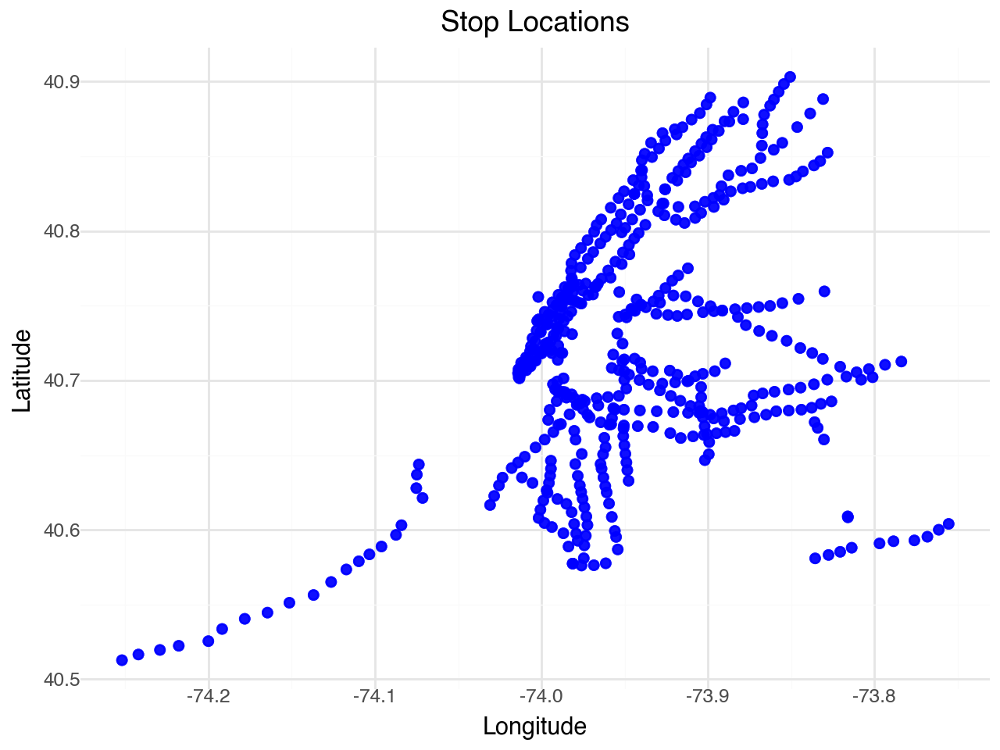

In [22]:

stops_pd = stops_pl.to_pandas()

# Create the plot
plot = (
    ggplot(stops_pd, aes(x='stop_lon', y='stop_lat')) +
    geom_point(alpha=0.6, color='blue', size=2) +
    labs(
        title='Stop Locations',
        x='Longitude',
        y='Latitude'
    ) +
    theme_minimal()
)

plot

Looks reasonable. Let's get the route colors to make this a bit prettier.

In [23]:
stops_pl = (
  stops_pl.join(
    stop_times_pl,
    on="stop_id",
    how="inner"
  )
  .join(
    trips_pl,
    on="trip_id",
    how="inner"
  )
  .join(
    routes_pl,
    on="route_id",
    how="inner"
  )
  .select([
    "route_id", "route_color", "stop_id", "stop_lat", "stop_lon"
  ])
  .unique()
  .with_columns(
    route_color = pl.when(pl.col("route_color").str.contains("#"))
      .then(pl.col("route_color")) # Cleanup places where we are missing '#'
      .otherwise(pl.lit("#") + pl.col("route_color"))
      .fill_null("#FFFFFF") # Replace missing colors with white
  )
)

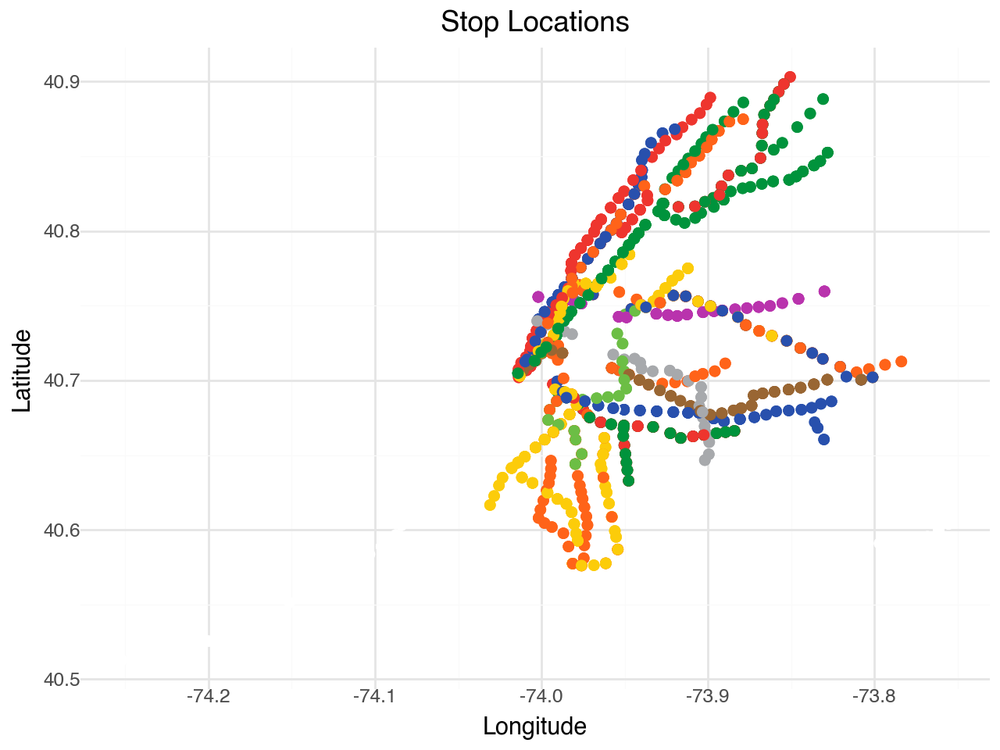

In [24]:
stops_pd = stops_pl.to_pandas()

plot_2 = (
    ggplot(stops_pd, aes(x='stop_lon', y='stop_lat')) +
    geom_point(aes(color='route_color'), size=2) +
    labs(
        title='Stop Locations',
        x='Longitude',
        y='Latitude'
    ) +
    theme_minimal() + 
    scale_color_identity() +
    guides(color="none")
)

plot_2

Now that we have all the stops, let's load in community district tabulation area data from NYC Open Data.

In [2]:
cdta_geo_pl = pl.read_csv("2020_Community_District_Tabulation_Areas__CDTAs__20250405.csv").clean_names()
cdta_geo_pl.head()

the_geom,borocode,boroname,countyfips,cdta2020,cdtaname,cdtatype,shape_leng,shape_area
str,i64,str,i64,str,str,i64,f64,f64
"""MULTIPOLYGON (((-73.7932287088…",2,"""Bronx""",5,"""BX12""","""BX12 Wakefield-Williamsbridge-…",0,84041.51898,1.5017e8
"""MULTIPOLYGON (((-73.9623659688…",1,"""Manhattan""",61,"""MN06""","""MN06 East Midtown-Murray Hill …",0,44808.662398,4.3103e7
"""MULTIPOLYGON (((-73.8964113348…",2,"""Bronx""",5,"""BX08""","""BX08 Riverdale-Kingsbridge-Mar…",0,50413.975829,8.6266e7
"""MULTIPOLYGON (((-74.0109284111…",1,"""Manhattan""",61,"""MN01""","""MN01 Financial District-Tribec…",0,96270.213027,4.4812e7
"""MULTIPOLYGON (((-73.8728719583…",4,"""Queens""",81,"""QN80""","""QN80 LaGuardia Airport (JIA 80…",1,42122.472431,3.0592e7


In [3]:
cdta_pop_pl = pl.read_csv("New_York_City_Population_By_Community_Districts_20250405.csv").clean_names()
cdta_pop_pl.head()

borough,cd_number,cd_name,1970_population,1980_population,1990_population,2000_population,2010_population
str,i64,str,i64,i64,i64,i64,i64
"""Bronx""",1,"""Melrose, Mott Haven, Port Morr…",138557,78441,77214,82159,91497
"""Bronx""",2,"""Hunts Point, Longwood""",99493,34399,39443,46824,52246
"""Bronx""",3,"""Morrisania, Crotona Park East""",150636,53635,57162,68574,79762
"""Bronx""",4,"""Highbridge, Concourse Village""",144207,114312,119962,139563,146441
"""Bronx""",5,"""University Hts., Fordham, Mt. …",121807,107995,118435,128313,128200


In [4]:
# Build a CDTA join key
cdta_pop_pl = cdta_pop_pl.with_columns(
  boro_code = pl.when(pl.col("borough") == "Manhattan").then(pl.lit("MN"))
      .when(pl.col("borough") == "Bronx").then(pl.lit("BX"))
      .when(pl.col("borough") == "Brooklyn").then(pl.lit("BK"))
      .when(pl.col("borough") == "Queens").then(pl.lit("QN"))
      .when(pl.col("borough") == "Staten Island").then(pl.lit("SI"))
      .otherwise(pl.col("borough")),
  cd_code = pl.col("cd_number").cast(pl.Utf8).str.pad_start(2, "0")
).with_columns(
  cdta2020 = pl.col("boro_code") + pl.col("cd_code")
)

In [8]:
cd_pl = cdta_pop_pl.join(
  cdta_geo_pl,
  on="cdta2020",
  how="inner"
)

cd_pl.head()

borough,cd_number,cd_name,1970_population,1980_population,1990_population,2000_population,2010_population,boro_code,cd_code,cdta2020,the_geom,borocode,boroname,countyfips,cdtaname,cdtatype,shape_leng,shape_area
str,i64,str,i64,i64,i64,i64,i64,str,str,str,str,i64,str,i64,str,i64,f64,f64
"""Bronx""",12,"""Wakefield, Williamsbridge""",135010,128226,129620,149077,152344,"""BX""","""12""","""BX12""","""MULTIPOLYGON (((-73.7932287088…",2,"""Bronx""",5,"""BX12 Wakefield-Williamsbridge-…",0,84041.51898,1.5017e8
"""Manhattan""",6,"""Stuyvesant Town, Turtle Bay""",122465,127554,133748,136152,142745,"""MN""","""06""","""MN06""","""MULTIPOLYGON (((-73.9623659688…",1,"""Manhattan""",61,"""MN06 East Midtown-Murray Hill …",0,44808.662398,4.3103e7
"""Bronx""",8,"""Riverdale, Kingsbridge, Marble…",103543,98275,97030,101332,101731,"""BX""","""08""","""BX08""","""MULTIPOLYGON (((-73.8964113348…",2,"""Bronx""",5,"""BX08 Riverdale-Kingsbridge-Mar…",0,50413.975829,8.6266e7
"""Manhattan""",1,"""Battery Park City, Tribeca""",7706,15918,25366,34420,60978,"""MN""","""01""","""MN01""","""MULTIPOLYGON (((-74.0109284111…",1,"""Manhattan""",61,"""MN01 Financial District-Tribec…",0,96270.213027,4.4812e7
"""Manhattan""",3,"""Lower East Side, Chinatown""",181845,154848,161617,164407,163277,"""MN""","""03""","""MN03""","""MULTIPOLYGON (((-73.9824589856…",1,"""Manhattan""",61,"""MN03 Lower East Side-Chinatown…",0,38250.787945,4.7001e7


In [27]:
# Convert to geometry 
# cd_pd = cd_pl.to_pandas()
# cd_pd['geometry'] = gpd.GeoSeries.from_wkt(cd_pd['the_geom'])

# Create a GeoDataFrame with CRS specified (EPSG:4326 is standard lat/long)
# gdf = gpd.GeoDataFrame(cd_pd, geometry='geometry', crs="EPSG:4326")

# Convert to from string to geometry 
cd_pl = cd_pl.with_columns(
    geometry=pl.col("the_geom")
      .map_elements(lambda x: wkt.loads(x) if x else None)
)


/var/folders/rw/r56lcxyj1k71s10356fhcw000000gn/T/ipykernel_91269/2845398213.py:9: MapWithoutReturnDtypeWarning: Calling `map_elements` without specifying `return_dtype` can lead to unpredictable results. Specify `return_dtype` to silence this warning.


In [33]:
# Convert from polars to geodataframe
cd_gdf = gpd.GeoDataFrame(cd_pl.to_pandas(), geometry='geometry')
cd_gdf.set_crs(epsg=4326, inplace=True)  # Set CRS to lat/long

# Create a map
m = folium.Map(
  location=[40.7128, -74.0060], 
  zoom_start=10,
  tiles='CartoDB positron'  # More minimal basemap
)
# m = folium.Map(location=[gdf.geometry.y.mean(), gdf.geometry.x.mean()], zoom_start=10)

# Add geometries to the map
folium.GeoJson(cd_gdf).add_to(m)

# Display the map
m

Now that we can plot the community districts, let's do a geospatial join with the subway stops.

In [ ]:
# Convert stops to GeoDataFrame with Point geometries
stops_pd = stops_pl.to_pandas()
stops_geometry = [Point(lon, lat) for lon, lat in zip(stops_pd['stop_lon'], stops_pd['stop_lat'])]
stops_gdf = gpd.GeoDataFrame(stops_pd, geometry=stops_geometry, crs="EPSG:4326")

In [ ]:
# Spatial join
joined_gdf = gpd.sjoin(
  stops_gdf, 
  cd_gdf, 
  how="inner", 
  predicate="within"
)



In [52]:
# Convert back to polars
joined_pl = pl.from_pandas(joined_gdf[["cdta2020", "stop_id", "route_id", "route_color", "2010_population"]])

# Confirm that population counts are unique per community district ID
(
  joined_pl
    .select(["cdta2020", "2010_population"])
    .unique()
    .group_by("cdta2020")
    .agg(pl.count())
    .sort("count", )
)



/var/folders/rw/r56lcxyj1k71s10356fhcw000000gn/T/ipykernel_91269/945995675.py:10: DeprecationWarning: `pl.count()` is deprecated. Please use `pl.len()` instead.


cdta2020,count
str,u32
"""BK16""",1
"""MN01""",1
"""BK04""",1
"""BK05""",1
"""BX02""",1
…,…
"""BX06""",1
"""MN09""",1
"""BK15""",1


In [69]:
stop_density_pl = (
  joined_pl
  .group_by(["cdta2020", "2010_population"])
  .agg(
    n_stops=pl.col("stop_id").n_unique(),
    n_routes=pl.col("route_id").n_unique(),
    n_lines=pl.col("route_color").n_unique())
  .with_columns(
    stops_per_capita=pl.col("n_stops") / pl.col("2010_population") * 10000
  )
)

In [70]:
# Join with spatial data

stop_density_gdf = cd_gdf[["cdta2020", "geometry"]].merge(
    stop_density_pl.to_pandas(),  
    on='cdta2020',  # Join column
    how='inner'  # Join type
)

stop_density_gdf.head()

,cdta2020,geometry,2010_population,n_stops,n_routes,n_lines,stops_per_capita
0,BX12,"MULTIPOLYGON (((-73.79323 40.88282, -73.79417 ...",152344,18,2,2,1.181537
1,MN06,"MULTIPOLYGON (((-73.96237 40.72421, -73.96201 ...",142745,10,9,5,0.700550
2,BX08,"MULTIPOLYGON (((-73.89641 40.9045, -73.89636 4...",101731,8,1,1,0.786388
3,MN01,"MULTIPOLYGON (((-74.01093 40.68449, -74.01193 ...",60978,46,15,5,7.543704
4,MN03,"MULTIPOLYGON (((-73.98246 40.70554, -73.98242 ...",163277,14,7,3,0.857439


In [71]:
m_density = folium.Map(
  location=[40.7128, -74.0060], 
  zoom_start=10,
  tiles='CartoDB positron'  # More minimal basemap
)

# Add a choropleth layer
folium.Choropleth(
    geo_data=stop_density_gdf,
    name='Stops Per Capita',
    data=stop_density_gdf,
    columns=['cdta2020', 'stops_per_capita'],
    key_on='feature.properties.cdta2020',
    fill_color='YlOrRd',  # Color scheme
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Stops Per Capita',
    highlight=True
    # scale_type="log"
).add_to(m_density)

folium.GeoJson(
    stop_density_gdf,
    name='District Info',
    tooltip=folium.GeoJsonTooltip(
        fields=['cdta2020', 'stops_per_capita'],
        aliases=['District:', 'Stops per Capita:'],
        localize=True,
        sticky=True
    ),
    # Make this layer invisible
    style_function=lambda x: {'fillOpacity': 0.0, 'weight': 0}  
).add_to(m_density)

# Add layer controls
folium.LayerControl().add_to(m_density)

# folium.GeoJson(stop_density_gdf).add_to(m_density)

m_density